In [1]:
import numpy as np

In [17]:
# set intial guess and other parameters
beta_old=0; beta_new=4; gamma=0.01; precision=0.00001

In [18]:
# dervative of function
def f_prime(beta):
    return 4 * beta**3 - 9 * beta**2

In [19]:
i = 0
while np.abs(beta_new - beta_old) > precision:
    beta_old = beta_new
    beta_new = beta_old - gamma * f_prime(beta_old)
    i = i + 1

In [20]:
print i
print beta_new

42
2.25003252689


In [21]:
import numpy as np

# Initial Guess
w_old = np.array([0, 0]).reshape((2,1))
w_new = np.array([-1.8,-.8]).reshape((2,1))
gamma = .0002 # set the learning rate
nu = .00001 # set the precision

def f1_primew1(w1, w2):
    return -2 * (1 - w1) - 400 * (w2 - w1**2) * w1

def f1_primew2(w1, w2):
    return 200 * (w2 - w1**2)

# Gradient Vector
def g_vec(w1, w2):
    return np.array([f1_primew1(w1, w2), f1_primew2(w1, w2)]).reshape((2,1))

# Perform Gradient Descent
r = 0
while np.linalg.norm(w_old - w_new) > nu:
    w_old = w_new
    w_new = w_old - gamma * g_vec(w_old[0,:], w_old[1,:])
    r = r + 1

print r
print w_new

23374
[[ 0.94648413]
 [ 0.89561108]]


http://alstatr.blogspot.com/2015/12/r-and-python-gradient-descent.html

In [5]:
library(ggplot2)
f <- function (beta) beta**4 - 3 * beta**3 + 2

beta <- seq(-2, 4, length.out = 100)
    
# Set the initial guess and other parameters
beta_old <- 0; beta_new <- 4; gamma <- 0.001; precision <- 0.00001

# Derivative of the function f
f_prime <- function (beta) 4 * beta**3 - 9 * beta**2

In [6]:
# Plot
dframe <- data.frame(beta = rep(beta, 2), curves = c(f(beta), f_prime(beta)), type = rep(c("f", "f'"), each = 100))

[1] 350

[1] 2.250483

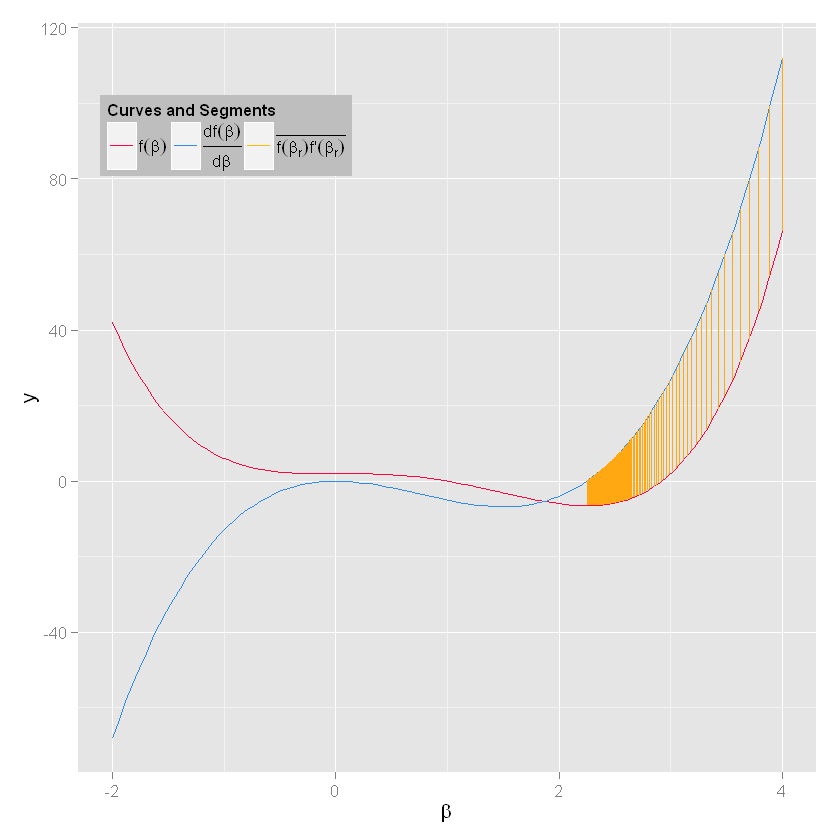

In [7]:
p <- ggplot(data = dframe, aes(x = beta, y = curves, colour = type)) + geom_line() + 
  geom_segment(aes(x = beta_new, y = f(beta_new), xend = beta_new, yend = f_prime(beta_new), colour = 'orange'), show.legend = TRUE) +
  xlab(expression(beta)) + ylab('y') +
  theme(legend.position = c(.2, .85),
        legend.background = element_rect(fill = 'gray')) +
  scale_colour_manual(
    name = 'Curves and Segments', 
    labels = c(
      expression(f(beta)), 
      expression(
        paste(frac(df(beta), paste('d', beta)), sep = "")
      ),
      expression(
        bar(paste(f(beta[r]), paste(f, "'", (beta[r]), sep = "")))
        )
      ),
    values = c('#FF033E', '#318CE7', '#FFBF00'),
    guide = guide_legend(direction = "horizontal", title.position = "top",
                         label.position = "right",
                         label.theme = element_text(angle = 0, size = 10))
    )

# Perform Gradient Descent
i <- 0 # Counter for number of iterations
p <- p + geom_segment(x = beta_new, y = f(beta_new), xend = beta_new, yend = f_prime(beta_new), colour = '#FFA812')
while (abs(beta_new - beta_old) > precision) {
  beta_old <- beta_new
  beta_new <- beta_old - gamma * f_prime(beta_old)
  p <- p + geom_segment(x = beta_new, y = f(beta_new), xend = beta_new, yend = f_prime(beta_new), colour = '#FFA812')
  i <- i + 1
}

# Print results
p; i; beta_new 